# Crop Disease Classification

* 1.Blight

* 2.Downy Mildew

* 3.Apple Scab

* 4.Cedar Apple Rust

* 5.Blossom end rot

* 6.Fire Blight

* 7.Verticillium

* 8.fusarium

* 9.Canker

* 10.Gray mold

* 11.Botrytis

* 12.Powdery mildew

* 13.Nematodes

* 14.black spot

* 15.Leaf spots

* 16.Anthracnose

* 17.Mosaic virus

* 18.Brown rot

* 19.Crown gall

* 20.Clubroot

In [1]:
!pip install -Uqq fastai fastbook nbdev

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.1/66.1 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.0/83.0 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 790.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 1.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━

In [2]:
from fastai import *
from fastbook import *
from fastai.vision.all import *

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
batch_size=20
%matplotlib inline

In [5]:
%cd /content/drive/MyDrive/Crop Disease Classification

/content/drive/MyDrive/Crop Disease Classification


In [6]:
crop_disease_label = ["Blight","Downy Mildew","Apple Scab","Cedar Apple Rust",
    "Blossom End Rot",
    "Fire Blight",
    "Verticillium",
    "Fusarium",
    "Canker",
    "Gray Mold",
    "Botrytis",
    "Powdery Mildew",
    "Nematodes",
    "Black Spot",
    "Leaf Spots",
    "Anthracnose",
    "Mosaic Virus",
    "Brown Rot",
    "Crown Gall",
    "Clubroot"]


print(f"Crop Disease Name : {crop_disease_label}")
print("====================================================================================")
print(f"Crop Disease Length : {len(crop_disease_label)}")


Crop Disease Name : ['Blight', 'Downy Mildew', 'Apple Scab', 'Cedar Apple Rust', 'Blossom End Rot', 'Fire Blight', 'Verticillium', 'Fusarium', 'Canker', 'Gray Mold', 'Botrytis', 'Powdery Mildew', 'Nematodes', 'Black Spot', 'Leaf Spots', 'Anthracnose', 'Mosaic Virus', 'Brown Rot', 'Crown Gall', 'Clubroot']
Crop Disease Length : 20


In [7]:
images = search_images_ddg(crop_disease_label[0])
print(f"Number of Images : {len(images)}")
print("==================================================================================================")
print(f"Image Url : {images[0]}")

Number of Images : 200
Image Url : https://agrilife.org/texasrowcrops/files/2015/09/Fig-2-NCLB_top-SCLB_bottom.jpg


# Read Image

In [8]:
name="Blight.jpg"
download_url(images[0],name,show_progress=True)

Path('Blight.jpg')

# Visualize Image

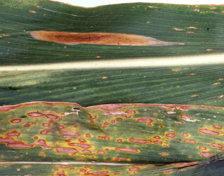

In [9]:
image=Image.open(name)
image.to_thumb(224,224)

In [10]:
data_path="my_data"
# if not os.path.exists(data_path):
#   os.mkdir(data_path)

# for fruit_type in crop_disease_label:
#   dest=f"{data_path}/{fruit_type}"
#   if not os.path.exists(dest):
#     os.mkdir(dest)

#   try:
#     fruit_image_urls=search_images_ddg(fruit_type)
#     download_images(dest,urls=fruit_image_urls)
#   except:
#     continue

In [11]:
data_count=get_image_files(data_path)
data_count

(#3742) [Path('my_data/Blight/9d3990dd-a283-45bb-86e9-3db4a3475cbc.jpg'),Path('my_data/Blight/58f8e269-cf67-4638-b049-05d465031d9a.jpg'),Path('my_data/Blight/0a6c5b80-8f64-460c-8126-f191e9d9e7ad.jpg'),Path('my_data/Blight/387c6438-1973-4ecc-82cc-a5abb82bb5e6.jpg'),Path('my_data/Blight/7b06a1c9-c392-4b85-9a98-5150fe5a42a5.jpeg'),Path('my_data/Blight/9d854bbb-51a2-4432-a2d8-fe086520f074.jpg'),Path('my_data/Blight/f6d0143a-2353-4417-9d57-85f85b23c9ae.png'),Path('my_data/Blight/7802fc41-3a01-48ae-9778-03d8819ebc75.jpg'),Path('my_data/Blight/1e45f844-c78a-4785-b461-ced9e1f159a2.jpg'),Path('my_data/Blight/06099dc7-db6a-455d-a535-f9ef948e1974.jpg')...]

In [12]:
each_data_count = {label: len(get_image_files(f"{data_path}/{label}")) for label in os.listdir(data_path) if os.path.isdir(os.path.join(data_path, label))}

# Print the count for each class
for label, count in each_data_count.items():
    print(f"{label}: {count} images")

Blight: 190 images
Downy Mildew: 197 images
Apple Scab: 191 images
Cedar Apple Rust: 189 images
Blossom End Rot: 191 images
Fire Blight: 190 images
Verticillium: 183 images
Fusarium: 172 images
Canker: 189 images
Gray Mold: 189 images
Botrytis: 181 images
Powdery Mildew: 192 images
Nematodes: 188 images
Black Spot: 168 images
Leaf Spots: 190 images
Anthracnose: 184 images
Mosaic Virus: 191 images
Brown Rot: 192 images
Crown Gall: 190 images
Clubroot: 185 images


In [13]:
fail=verify_images(data_count)
fail

(#0) []

In [14]:
fail.map(Path.unlink)

(#0) []

# Data Loaders

In [15]:
data_block=DataBlock(blocks=(ImageBlock,CategoryBlock),get_items=get_image_files,
                     splitter=RandomSplitter(valid_pct=0.2,seed=42),
                     get_y=parent_label,
                     item_tfms=Resize(128))

In [16]:
dls=data_block.dataloaders(data_path,bs=batch_size)

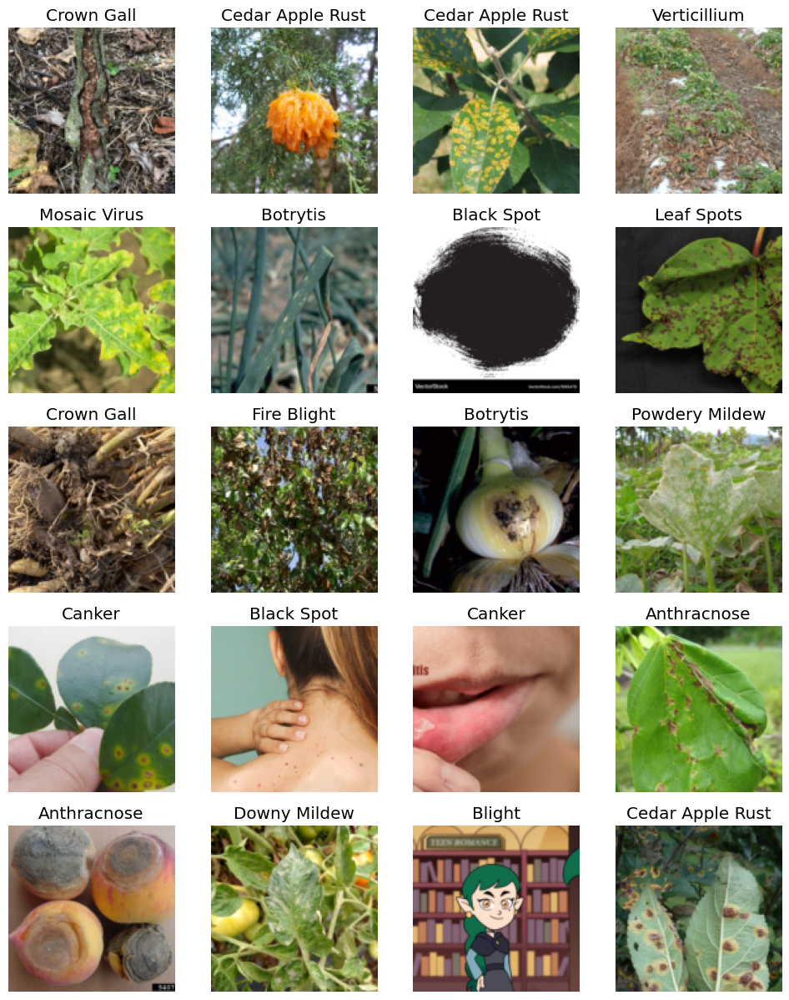

In [17]:
dls.train.show_batch(max_n=25,nrows=5)

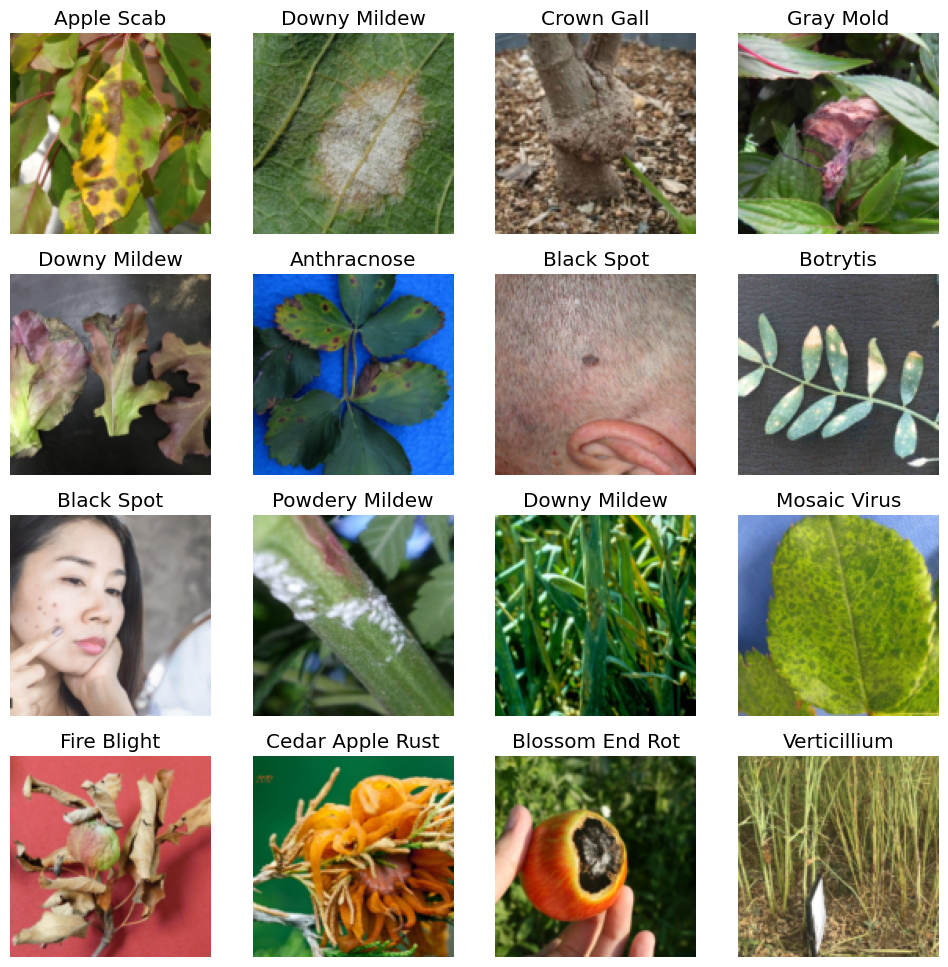

In [18]:
dls.valid.show_batch(max_n=16,nrows=4)

# Data Augmentation

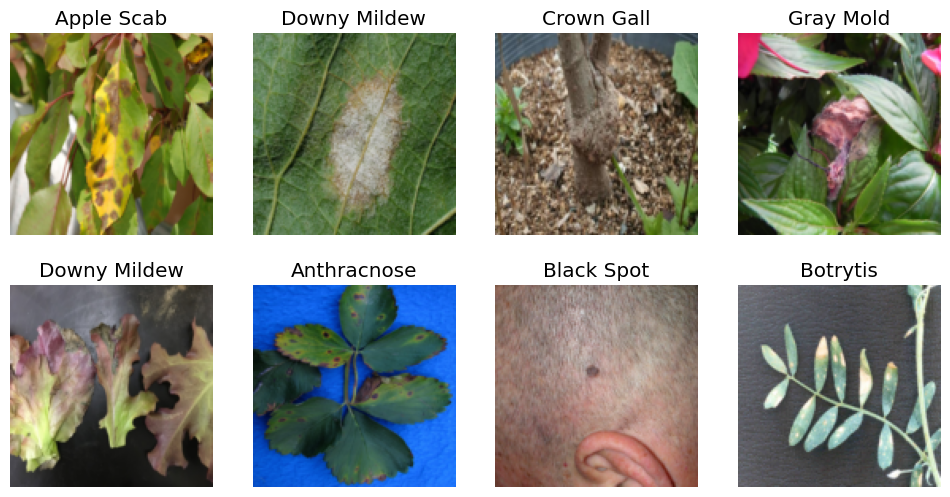

In [19]:
dblock = data_block.new(item_tfms=Resize(128, ResizeMethod.Squish)) # Squishing the whole image into (128 x 128) size
dls = dblock.dataloaders(data_path)
dls.valid.show_batch(max_n=8, nrows=2)

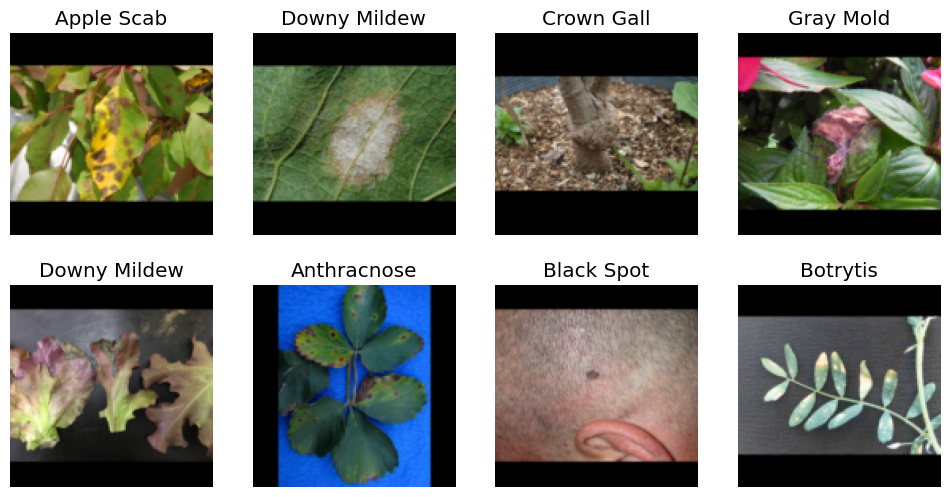

In [20]:
dblock = data_block.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros')) # Padding the extra spaced the whole image into (128 x 128) size without squishing
dls = dblock.dataloaders(data_path)
dls.valid.show_batch(max_n=8, nrows=2)

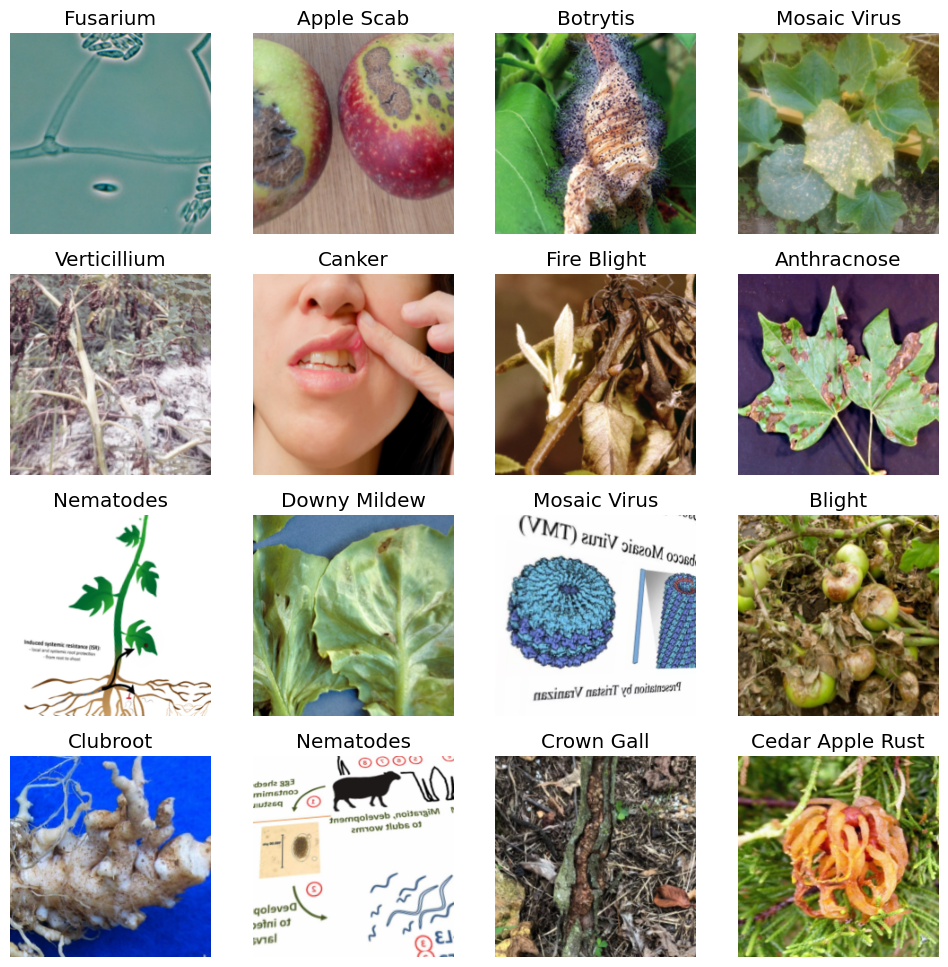

In [21]:
dblock = data_block.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())
dls = dblock.dataloaders(data_path)
dls.train.show_batch(max_n=16, nrows=4)

In [22]:
dls.train.vocab

['Anthracnose', 'Apple Scab', 'Black Spot', 'Blight', 'Blossom End Rot', 'Botrytis', 'Brown Rot', 'Canker', 'Cedar Apple Rust', 'Clubroot', 'Crown Gall', 'Downy Mildew', 'Fire Blight', 'Fusarium', 'Gray Mold', 'Leaf Spots', 'Mosaic Virus', 'Nematodes', 'Powdery Mildew', 'Verticillium']

In [23]:
from fastai.vision.widgets import *
model_path = "models"
model = vision_learner(dls, resnet50, metrics=[error_rate, accuracy])

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 63.0MB/s]


In [24]:
model.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,3.230006,1.974787,0.533422,0.466578,01:55


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.895312,1.689443,0.475936,0.524064,01:58
1,1.621433,1.588490,0.447861,0.552139,02:00
2,1.326431,1.490331,0.406417,0.593583,01:58
3,1.043996,1.416219,0.381016,0.618984,01:57
4,0.868167,1.415217,0.391711,0.608289,01:55


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes sh

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


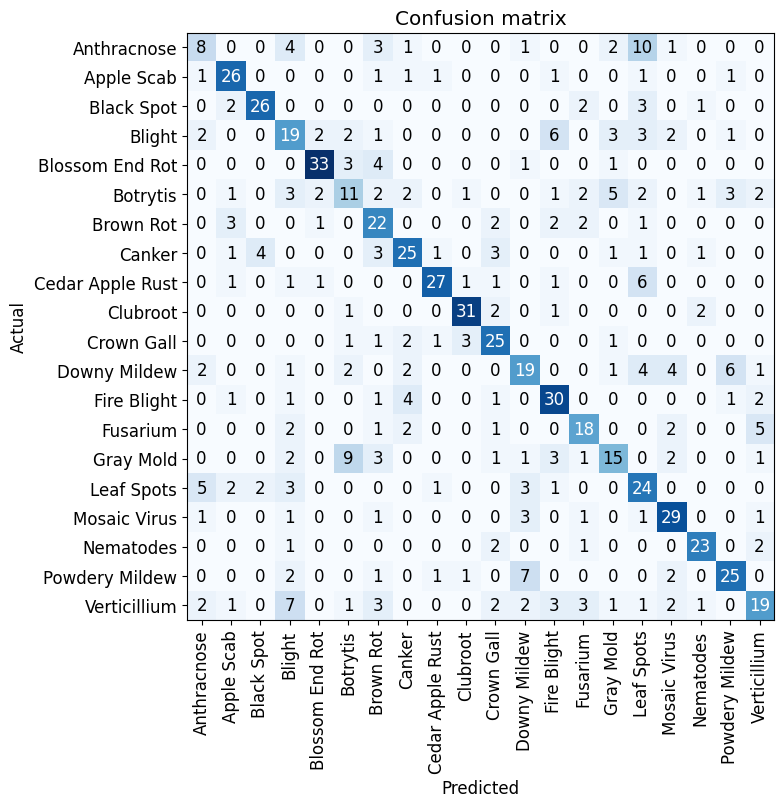

In [25]:
interp = ClassificationInterpretation.from_learner(model)
interp.plot_confusion_matrix(figsize=(8,8))

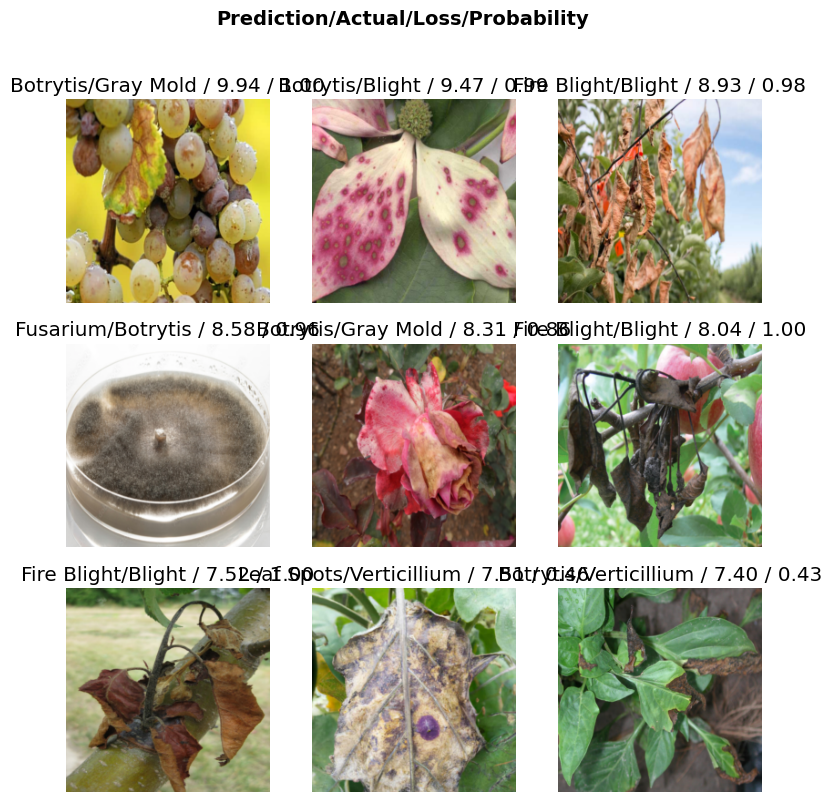

In [26]:
interp.plot_top_losses(9, nrows=3)

In [27]:
cleaner = ImageClassifierCleaner(model)
cleaner

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [28]:
cleaner.delete()

(#0) []

In [29]:
cleaner.change()

(#0) []

In [30]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()                                    # delete irrelevant data
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), f"{data_path}/{cat}") # change the directory

# Export model for inference

In [32]:
model.export(f"{model_path}/fruit_model_1.pkl")

In [33]:
test_image_path="test_image"
model_path_pred=f"models/fruit_model_1.pkl"
model=load_learner(model_path_pred)

# prediction_1

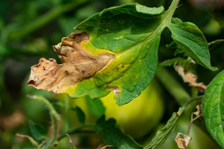

In [36]:
img=Image.open(f"{test_image_path}/image_1.jpg")
img.to_thumb(224,224)


In [37]:
model.predict(f'{test_image_path}/image_1.jpg')

('Blight',
 tensor(3),
 tensor([0.3107, 0.0017, 0.0053, 0.3680, 0.0031, 0.0883, 0.0026, 0.0075, 0.0020, 0.0031, 0.0057, 0.0180, 0.0015, 0.0022, 0.0574, 0.1002, 0.0042, 0.0009, 0.0045, 0.0130]))

# prediction_2

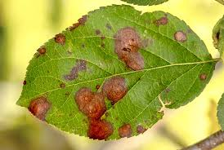

In [38]:
img=Image.open(f"{test_image_path}/image_2.jpeg")
img.to_thumb(224,224)

In [40]:
model.predict(f'{test_image_path}/image_2.jpeg')

('Cedar Apple Rust',
 tensor(8),
 tensor([3.9151e-02, 1.1856e-01, 5.0087e-03, 1.2011e-04, 3.8889e-05, 3.1102e-04, 5.0355e-04, 1.3470e-01, 6.6480e-01, 3.7278e-04, 1.1472e-03, 5.4637e-04, 3.3492e-03, 9.3984e-06, 4.9394e-04, 2.9537e-02,
         4.2839e-04, 3.7364e-04, 7.6347e-05, 4.8251e-04]))

# prediction_3

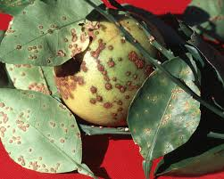

In [41]:
img=Image.open(test_image_path+"/image_3.jpeg")
img.to_thumb(224,224)

In [42]:
model.predict(f'{test_image_path}/image_3.jpeg')

('Canker',
 tensor(7),
 tensor([5.2132e-02, 6.4328e-02, 1.1078e-02, 6.7059e-03, 2.6110e-03, 1.7882e-02, 3.6798e-02, 5.8322e-01, 1.3162e-01, 2.3449e-03, 6.7263e-03, 2.7575e-03, 3.0561e-02, 1.0588e-03, 1.1998e-02, 3.4285e-02,
         4.8075e-04, 2.7347e-04, 1.9773e-03, 1.1702e-03]))